# Homograph Estimation

In [50]:
import json
import numpy as np
import cv2
import mmcv
import pickle
from matplotlib import pyplot as plt
from IPython import display

### Source View from Monitoring Camera

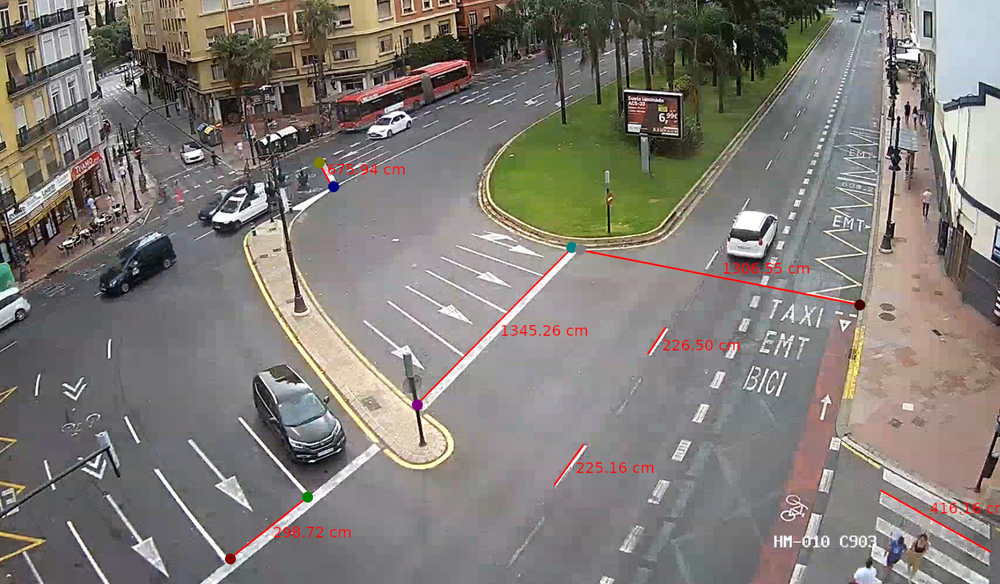

In [23]:
display.Image("/Users/Qianyu/Downloads/Unleash/label_camera.png")

## Target View in the bird-eye-view

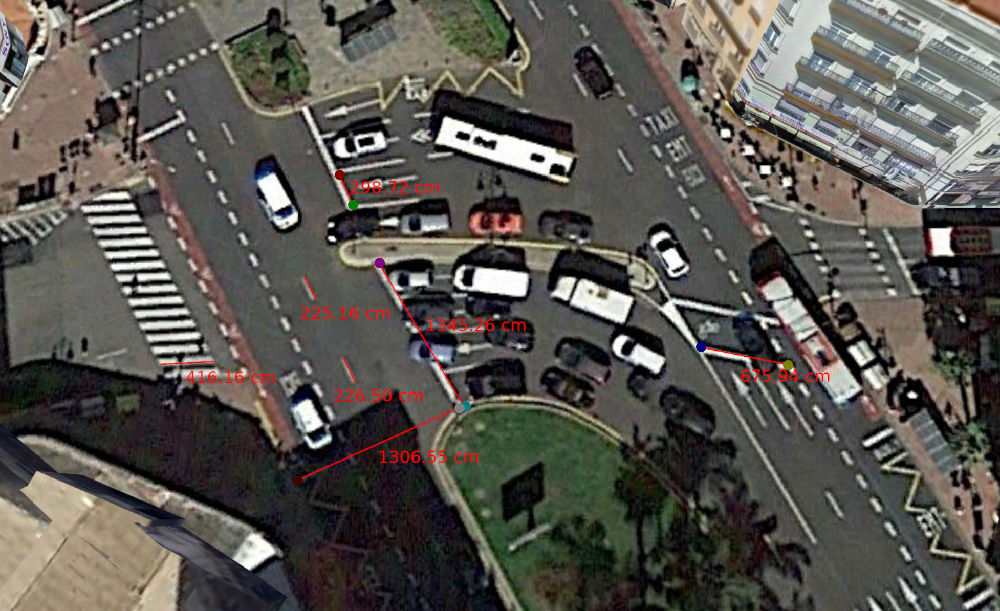

In [22]:
display.Image("/Users/Qianyu/Downloads/Unleash/label_earth.png")

## Step 1: Label the corresponding points in two views

In [34]:
label_camera = json.load(open(os.path.join(data_path, 'label_camera_point.json'), 'r'))
label_earth = json.load(open(os.path.join(data_path, 'label_earth_points.json'), 'r'))

## Step 2: Calculate the homography matrix for location transformation

In [103]:
def cal_homograph_matrix(src_labels, tgt_labels, point_num=8):
    s_points = []
    t_points = []
    for i in [0,1,4,5]:
        s_points.append(src_labels['shapes'][i]['points'][0])
        t_points.append(tgt_labels['shapes'][i]['points'][0])
    
    H, _ = cv2.findHomography(np.array(s_points), np.array(t_points))
    return H

In [104]:
H = cal_homograph_matrix(label_camera, label_earth)

## Step 3: Transform the detection result into target view

In [67]:
def transform_two_point_target(bbox, H):
    # upper left
    point = np.ones((3,1))
    point[0:2, 0] = bbox[0:2]
    new_point = np.matmul(H, point)
    bbox[:2] = [new_point[0], new_point[1]]
    # lower right
    point = np.ones((3,1))
    point[0:2, 0] = bbox[2:4]
    new_point = np.matmul(H, point)
    bbox[2:4] = [new_point[0], new_point[1]]
    return bbox

In [125]:
result = pickle.load(open('/Users/Qianyu/Projects/mmdetection/results/target_0.pkl', 'rb'))

In [126]:
result[2][0]

array([1.1297322e+03, 1.8657277e+02, 1.1757196e+03, 2.2312755e+02,
       9.6725291e-01], dtype=float32)

In [131]:
def transform_four_point_target(bb, H):
    x0, y0, x1, y1 = bb[0], bb[1], bb[2], bb[3]
    points = []
    # upper left
    point = np.ones((3,1))
    point[0:2, 0] = [x0, y0]
    new_point = np.matmul(H, point)
    points.append((int(new_point[0]), int(new_point[1])))
    # upper right
    point = np.ones((3,1))
    point[0:2, 0] = [x1, y0]
    new_point = np.matmul(H, point)
    points.append((int(new_point[0]), int(new_point[1])))
    # lower left
    point = np.ones((3,1))
    point[0:2, 0] = [x0, y1]
    new_point = np.matmul(H, point)
    points.append((int(new_point[0]), int(new_point[1])))
    # lower right
    point = np.ones((3,1))
    point[0:2, 0] = [x1, y1]
    new_point = np.matmul(H, point)
    points.append((int(new_point[0]), int(new_point[1])))
    return points

In [132]:
target_ps = transform_four_point_target(result[2][0], H)

In [133]:
target_ps

[(376, 523), (344, 459), (327, 457), (294, 394)]

### test

In [108]:
bb = transform_to_target(result[2][0], H)

/Users/qianyu/opt/anaconda3/envs/openmmlab/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.
  
/Users/qianyu/opt/anaconda3/envs/openmmlab/lib/python3.7/site-packages/ipykernel_launcher.py:11: DeprecationWarning: setting an array element with a sequence. This was supported in some cases where the elements are arrays with a single element. For example `np.array([1, np.array([2])], dtype=int)`. In the future this will raise the same ValueError as `np.array([1, [2]], dtype=int)`.
  # This is added back by InteractiveShellApp.init_path()


In [109]:
bb

array([376.5388   , 523.3555   , 294.83344  , 394.14847  ,   0.9672529],
      dtype=float32)

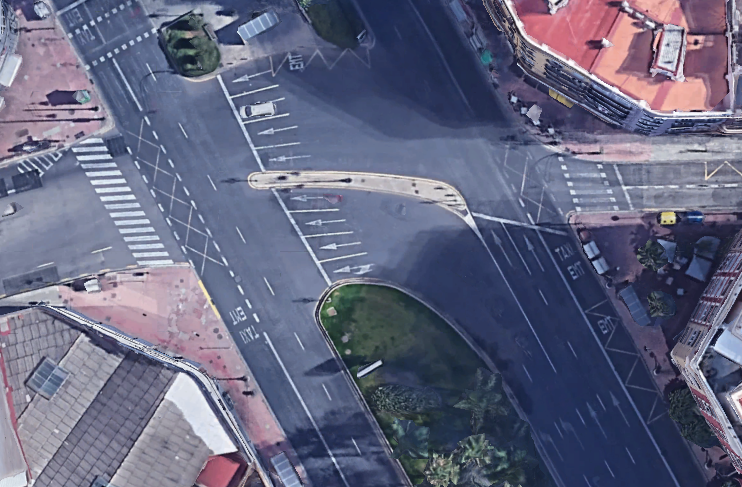

In [93]:
display.Image("/Users/Qianyu/Downloads/Unleash/Google_earth_old.png")

## Step 3: Visualize the transformed result in the target view

In [148]:
img = mmcv.imread("/Users/Qianyu/Downloads/Unleash/Google_earth_old.png")

In [117]:
h_s, w_s = 1080, 1920
h_t, w_t, _ = img.shape

In [118]:
t_x0, t_y0 = int(bb[0] * h_t/h_s), int(bb[1] * w_t/w_s)
t_x1, t_y1 = int(bb[2] * h_t/h_s), int(bb[3] * w_t/w_s)

In [122]:
draw = cv2.rectangle(img, (t_x0, t_y0), (t_x1, t_y1), (255,0,0), 2)

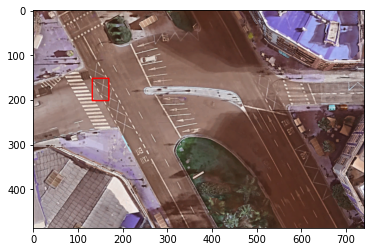

In [123]:
plt.imshow(img)

In [141]:
ps = np.array(target_ps,
              np.int32)
ps[:,0] = ps[:,0] * h_t/h_s
ps[:,1] = ps[:,1] * w_t/w_s

In [142]:
ps

array([[169, 202],
       [155, 177],
       [147, 176],
       [132, 152]], dtype=int32)

In [149]:
cv2.polylines(img, np.array([ps]), True, (255,0,0), 2)

array([[[144, 119, 108],
        [178, 151, 138],
        [ 91,  56,  44],
        ...,
        [135, 110, 128],
        [147, 128, 146],
        [143, 123, 141]],

       [[182, 156, 144],
        [130, 104,  91],
        [111,  77,  62],
        ...,
        [142, 121, 139],
        [147, 129, 147],
        [142, 122, 140]],

       [[197, 172, 160],
        [114,  89,  74],
        [116,  80,  66],
        ...,
        [147, 129, 147],
        [147, 129, 146],
        [143, 128, 141]],

       ...,

       [[240, 232, 224],
        [236, 228, 219],
        [238, 231, 222],
        ...,
        [ 49,  24,  24],
        [ 87,  65,  78],
        [ 83,  59,  84]],

       [[243, 235, 226],
        [230, 223, 214],
        [240, 232, 224],
        ...,
        [ 48,  25,  25],
        [ 54,  31,  36],
        [ 98,  73,  99]],

       [[242, 234, 226],
        [233, 225, 216],
        [241, 234, 225],
        ...,
        [ 47,  27,  24],
        [ 51,  30,  35],
        [115,  88, 111]]